# Loading the dataset

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import numpy as np
import os
import matplotlib.pyplot as plt

from nltk.corpus import stopwords
import nltk
nltk.download('stopwords')
from nltk.corpus import stopwords
from collections import Counter
import re

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [ ]:
! mkdir ~/.kaggle
! cp kaggle.json ~/.kaggle/
! chmod 600 ~/.kaggle/kaggle.json

In [ ]:
! kaggle datasets download --force adityajn105/flickr8k

100% 1.04G/1.04G [00:10<00:00, 145MB/s]
100% 1.04G/1.04G [00:10<00:00, 110MB/s]


In [ ]:
!unzip \*.zip  && rm *.zip

In [ ]:
caption_file = 'captions.txt'
df = pd.read_csv(caption_file)

# EDA

## Creating two dataframes, one for images, another for captions

In [ ]:
df['comment_number']=df.index%5
df

,image,caption,comment_number
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,0
1,1000268201_693b08cb0e.jpg,A girl going into a wooden building .,1
2,1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .,2
3,1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playh...,3
4,1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a woo...,4
...,...,...,...
40450,997722733_0cb5439472.jpg,A man in a pink shirt climbs a rock face,0
40451,997722733_0cb5439472.jpg,A man is rock climbing high in the air .,1
40452,997722733_0cb5439472.jpg,A person in a red shirt climbing up a rock fac...,2
40453,997722733_0cb5439472.jpg,A rock climber in a red shirt .,3


In [ ]:
image_name = {
    'image_name':df[df['comment_number'] == df['comment_number'][0]]['image'].values,
}
comments = {
    'comment_0':df[df['comment_number'] == df['comment_number'][0]]['caption'].values,
    'comment_1':df[df['comment_number'] == df['comment_number'][1]]['caption'].values,
    'comment_2':df[df['comment_number'] == df['comment_number'][2]]['caption'].values,
    'comment_3':df[df['comment_number'] == df['comment_number'][3]]['caption'].values,
    'comment_4':df[df['comment_number'] == df['comment_number'][4]]['caption'].values,
}

In [ ]:
image_name_df = pd.DataFrame.from_dict(image_name)
comments_df = pd.DataFrame.from_dict(comments)

image_name_df.shape, comments_df.shape

((8091, 1), (8091, 5))

In [ ]:
image_name_comments_df = pd.concat([image_name_df, comments_df], axis=1)

In [ ]:
image_name_comments_df.shape

(8091, 6)

In [ ]:
image_name_comments_df.head()

,image_name,comment_0,comment_1,comment_2,comment_3,comment_4
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...
1,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .
2,1002674143_1b742ab4b8.jpg,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...
3,1003163366_44323f5815.jpg,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...
4,1007129816_e794419615.jpg,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...


## Image DataFrame EDA

In [ ]:
image_name_df.head()

,image_name
0,1000268201_693b08cb0e.jpg
1,1001773457_577c3a7d70.jpg
2,1002674143_1b742ab4b8.jpg
3,1003163366_44323f5815.jpg
4,1007129816_e794419615.jpg


In [ ]:
image_name_df.shape

(8091, 1)

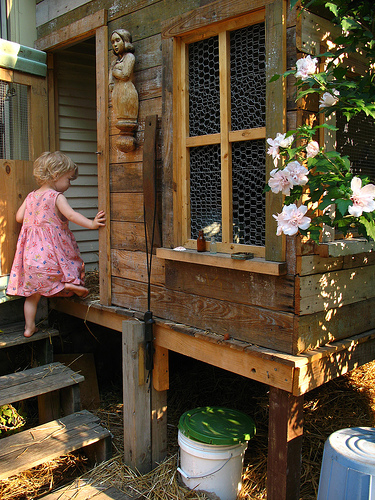

In [ ]:
from tensorflow.keras.utils import load_img

load_img('./Images/' + image_name_df.image_name[0])

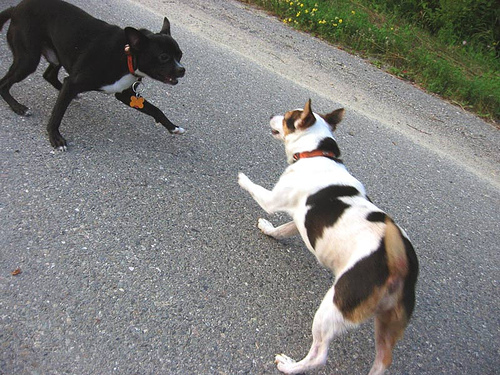

In [ ]:
load_img('./Images/' + image_name_df.image_name[1])

## Comments DataFrame EDA

In [ ]:
comments_df.head()

,comment_0,comment_1,comment_2,comment_3,comment_4
0,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...
1,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .
2,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...
3,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...
4,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...


In [ ]:
comments_df.shape

(8091, 5)

In [ ]:
comments_df.isna().sum()

comment_0    0
comment_1    0
comment_2    0
comment_3    0
comment_4    0
dtype: int64

No missing values.

In [ ]:
comments_df.describe()

,comment_0,comment_1,comment_2,comment_3,comment_4
count,8091,8091,8091,8091,8091
unique,8075,8075,8062,8069,8078
top,A black and white dog jumps over a hurdle .,A person on a bmx bike .,A black dog running through water .,Two dogs playing in the snow .,Two dogs playing in the snow .
freq,2,3,3,3,3


We have some captions that appears several times.
Let's check if there is an issue.

For comment_0 column:

In [ ]:
comments_df[comments_df.comment_0==comments_df.describe()['comment_0'].top]

,comment_0,comment_1,comment_2,comment_3,comment_4
2478,A black and white dog jumps over a hurdle .,A black dog jumps over hurdles .,"A black , white and brown tri-colored mid-size...",A dog is jumping over a barrier at a agility c...,A dog jumping over an obstacle course fence .
2673,A black and white dog jumps over a hurdle .,A dog jumping over high jump poles at show .,A dog jumps over an obstacle outside .,A small dog jumps over a striped gate .,A small dog leaps a barrier .


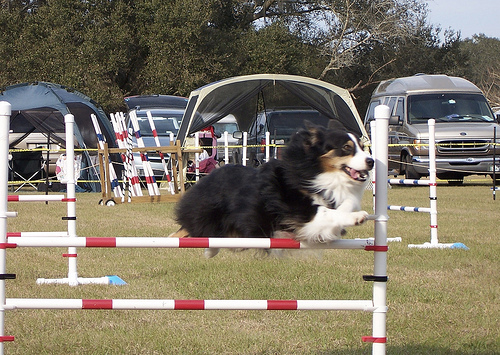

In [ ]:
load_img('./Images/' + image_name_df.image_name[2478])

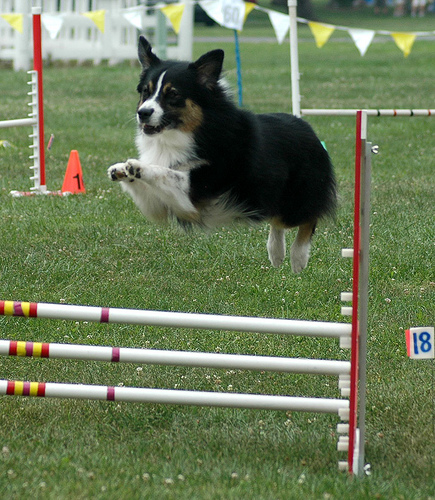

In [ ]:
load_img('./Images/' + image_name_df.image_name[2673])

These are very similar pictures so we have the same captions.

For comment_1 column:

In [ ]:
comments_df[comments_df.comment_1==comments_df.describe()['comment_1'].top]

,comment_0,comment_1,comment_2,comment_3,comment_4
3439,A biker rides on a dirt road .,A person on a bmx bike .,A person on a BMX bike is riding on an outdoor...,A person rides his mountain bike down a dirt r...,Dirt bike rider jumping down the hill .
5500,A BMX bike rider in a black and red uniform on...,A person on a bmx bike .,A person wearing a black helmet rides a red bi...,Biker with helmet riding red dirt bike in the ...,Dirt bike rider getting ready to start down th...
5752,"A biker with a blue jacket , black pants , and...",A person on a bmx bike .,Person in blue jacket on a bike on a dirt cour...,The biker in blue is going around a corner .,The motocross rider wearing blue and black pan...


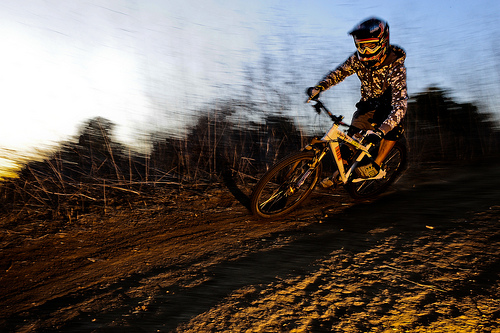

In [ ]:
load_img('./Images/' + image_name_df.image_name[3439])

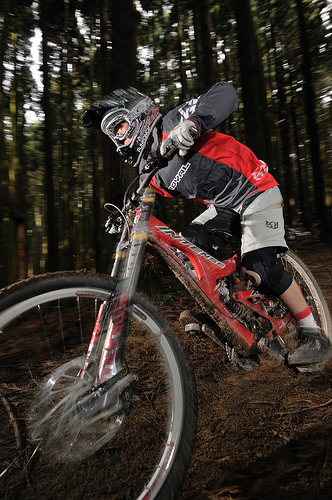

In [ ]:
load_img('./Images/' + image_name_df.image_name[5500])

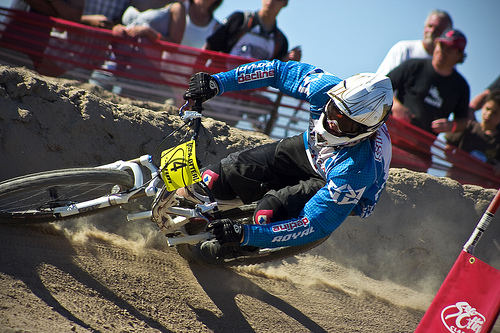

In [ ]:
load_img('./Images/' + image_name_df.image_name[5752])

These are very similar pictures so we have the same captions.

And so on, so similar images will have same captions sometimes.

## Finding information in the captions

In [ ]:
stop_words = stopwords.words('english')
df['caption_no_stopwords'] = df['caption'].apply(lambda x: ' '.join(
    [word.lower() for word in x.split() if word.lower() not in (stop_words)]))

all_captions =' '.join(df['caption_no_stopwords'])
all_captions = re.sub(r'[^\w\s]', '', all_captions)
all_captions

'child pink dress climbing set stairs entry way  girl going wooden building  little girl climbing wooden playhouse  little girl climbing stairs playhouse  little girl pink dress going wooden cabin  black dog spotted dog fighting black dog tricolored dog playing road  black dog white dog brown spots staring street  two dogs different breeds looking road  two dogs pavement moving toward  little girl covered paint sits front painted rainbow hands bowl  little girl sitting front large painted rainbow  small girl grass plays fingerpaints front white canvas rainbow  girl pigtails sitting front rainbow painting  young girl pigtails painting outside grass  man lays bench dog sits  man lays bench white dog also tied  man sleeping bench outside white black dog sitting next  shirtless man lies park bench dog  man laying bench holding leash dog sitting ground man orange hat starring something  man wears orange hat glasses  man gauges glasses wearing blitz hat  man glasses wearing beer crocheted ha

POS captions

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')
nltk.download('universal_tagset')

[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Unzipping taggers/averaged_perceptron_tagger.zip.
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Unzipping taggers/universal_tagset.zip.


True

In [ ]:
tokenized_words = word_tokenize(all_captions)
list_of_words_tagged = nltk.pos_tag(tokenized_words, tagset='universal')

In [ ]:
pos_counts = nltk.FreqDist(tag for (word, tag) in list_of_words_tagged)
print("the five most common tags are", pos_counts.most_common(5))

the five most common tags are [('NOUN', 121419), ('VERB', 55603), ('ADJ', 52599), ('NUM', 9236), ('ADP', 6295)]


In [ ]:
word_counts = nltk.FreqDist(word for (word, tag) in list_of_words_tagged)
print("the five most common words are", word_counts.most_common(5))

the five most common words are [('dog', 8136), ('man', 7265), ('two', 5638), ('white', 3940), ('black', 3832)]


In [ ]:
common_words_by_tags=[]
tags=['NOUN', 'VERB', 'ADJ', 'ADV', 'NUM', 'ADP', 'PRON', 'DET', 'PRT', 'CONJ']
for c_tag in tags:
  temp = [word for (word, tag) in list_of_words_tagged if tag == c_tag]
  common_words_by_tags.append(nltk.FreqDist(temp).most_common(10))

In [ ]:
common_df = pd.DataFrame(common_words_by_tags).T
common_df.columns=tags
common_df

,NOUN,VERB,ADJ,ADV,NUM,ADP,PRON,DET,PRT,CONJ
0,"(dog, 7366)","(wearing, 2998)","(white, 3940)","(together, 413)","(two, 5638)","(near, 987)","(hat, 441)","(another, 956)","(back, 51)","(either, 6)"
1,"(man, 7265)","(running, 2062)","(black, 3832)","(back, 321)","(three, 1381)","(behind, 630)","(hardhat, 14)","(ball, 165)","(around, 16)","(photographer, 3)"
2,"(woman, 3402)","(playing, 1858)","(young, 2630)","(along, 213)","(one, 1216)","(brown, 494)","(whose, 6)","(hat, 23)","(brown, 15)","(gather, 3)"
3,"(people, 2883)","(standing, 1752)","(red, 2257)","(long, 178)","(four, 492)","(around, 480)","(self, 4)","(booth, 8)","(background, 11)","(leather, 2)"
4,"(water, 2783)","(sitting, 1366)","(little, 1758)","(away, 161)","(five, 158)","(across, 476)","(us, 4)","(basketball, 8)","(track, 10)","(tennis, 2)"
5,"(boy, 2393)","(holding, 1323)","(brown, 1756)","(around, 152)","(six, 77)","(outside, 415)","(wagon, 2)","(either, 8)","(backpack, 9)","(tub, 1)"
6,"(girl, 2136)","(jumping, 1263)","(blue, 1707)","(yard, 129)","(seven, 31)","(bike, 378)","(ocean, 2)","(cloth, 7)","(away, 8)","(edge, 1)"
7,"(dogs, 2121)","(walking, 1121)","(small, 1278)","(shore, 83)","(2, 24)","(along, 303)","(mother, 2)","(half, 2)","(dog, 6)","(street, 1)"
8,"(shirt, 1639)","(riding, 899)","(large, 1235)","(front, 80)","(5, 19)","(background, 290)","(elf, 2)","(neck, 2)","(along, 5)","(pit, 1)"
9,"(person, 1542)","(looking, 742)","(green, 1213)","(skateboard, 75)","(eight, 17)","(onto, 210)","(medal, 1)","(watches, 1)","(ocean, 3)","(tooth, 1)"


# Models

## Functions

In [ ]:
from nltk.stem.porter import PorterStemmer
from keras_preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten
from keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.applications import vgg16, ResNet50V2, xception, InceptionV3
import nltk
nltk.download('punkt')
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize
from sklearn.metrics import classification_report
from sklearn.model_selection import train_test_split
import tensorflow as tf

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
def find_simple_class(comments):
  labels = list()
  for comment in comments:
    stemmer = PorterStemmer()
    singles = [stemmer.stem(plural) for plural in word_tokenize(comment)]    
    label = set(IMAGE_LABELS) & set(singles)
    if label != set() and len(label) == 1:
      return list(label)[0]
  return None

In [ ]:
def find_class(comments):
  label = None
  labels = list()
  singles = list()
  for comment in comments:
    stemmer = PorterStemmer()
    singles += [stemmer.stem(plural) for plural in word_tokenize(comment)]

  for key, value in IMAGE_LABELS.items():
    if set(value) & set(singles) != set():
      return key

  return label

In [ ]:
def invert_dict(d): 
    inverse = dict() 
    for key in d: 
        # Go through the list that is saved in the dict:
        for item in d[key]:
            # Check if in the inverted dict the key exists
            if item not in inverse: 
                # If not create a new list
                inverse[item] = [key] 
            else: 
                inverse[item].append(key) 
    return inverse

In [ ]:
def find_labels(comments):


  labels = list()
  singles = list()
  for comment in comments:
    stemmer = PorterStemmer()
    singles += [stemmer.stem(plural) for plural in word_tokenize(comment)]

  for key, value in IMAGE_LABELS.items():
    labels += list(set(value) & set(singles))

  IMAGE_LABELS_REV = invert_dict(IMAGE_LABELS)
  labels_out = list()
  for label in labels:
    labels_out += IMAGE_LABELS_REV[label]

  return list(set(labels_out))

In [ ]:

def create_image_generators(df_4_train,df_4_test,seed,target_size,batch_size,augmentation=False):

  if augmentation:
    datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.1,\
                             rotation_range=35,height_shift_range=0.1,width_shift_range=0.1, horizontal_flip=True)
  else:
    datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.1)  

  train_gen=datagen.flow_from_dataframe(
  dataframe=df_4_train,
  directory="./Images/",
  x_col="image_name",
  y_col="label",
  subset="training",
  batch_size=batch_size,
  seed=seed,
  class_mode="categorical",
  target_size=target_size)

  valid_gen=datagen.flow_from_dataframe(
  dataframe=df_4_train,
  directory="./Images/",
  x_col="image_name",
  y_col="label",
  subset="validation",
  batch_size=batch_size,
  seed=seed,
  class_mode="categorical",
  target_size=target_size)

  test_datagen=ImageDataGenerator(rescale=1./255.)
  test_gen=test_datagen.flow_from_dataframe(
  dataframe=df_4_test,
  directory="./Images/",
  x_col="image_name",
  y_col="label",
  batch_size=1,
  seed=seed,
  shuffle=False,
  class_mode="categorical",
  target_size=target_size)

  return train_gen, valid_gen, test_gen

In [ ]:
def train_evaluate_model(train_generator, valid_generator, test_generator, img_size,\
                          pre_trained_model,train_all=True,mode='multi_class',\
                         lr=3e-5,patience = 3,epoch=10,head_units = 256):

  if mode == 'multi_label':
    act = 'sigmoid'
    loss = 'binary_crossentropy'
    metrics=[tf.keras.metrics.Precision(),tf.keras.metrics.Recall(),'accuracy']
  elif mode == 'multi_class':
    act = 'softmax'
    loss = 'categorical_crossentropy'
    metrics=['accuracy']
  
  pre_trained_model = pre_trained_model(include_top=False, input_shape=(img_size,img_size,3))
  pre_trained_model.trainable=train_all

  model = Sequential([pre_trained_model,
                      Flatten(),
                      Dense(head_units, activation='relu', trainable=True),
                      Dense(len(train_generator.class_indices), trainable=True, activation=act)
                      ])

  opt = Adam(learning_rate=lr)

  es = EarlyStopping(monitor='val_loss', patience = patience, restore_best_weights=True)

  model.compile(loss = loss, optimizer=opt, metrics=metrics)
  
  print('\n')
  model.fit(train_generator, validation_data=valid_generator,epochs=epoch,callbacks=es)
  
  print('\n')
  model.evaluate(test_generator)


  if mode == 'multi_label':

    IMAGE_LABELS_LIST = list(train_generator.class_indices.keys())
    n_images = len(test_generator.classes)
    n_labels = len(IMAGE_LABELS_LIST)
    encode_labels = np.zeros((n_images,n_labels)).astype(int)
    IMAGE_LABELS_LIST = list(train_generator.class_indices.keys())
    for i,labels in enumerate(test_generator.classes):   
      for label_index in labels:
        encode_labels[i,label_index] = 1

    y_prob = model.predict(test_generator)
    thresh = 0.5
    y_pred = np.array([[1 if i > thresh else 0 for i in j] for j in y_prob])
    print('Threshold:', thresh)
    print(classification_report(encode_labels, y_pred, target_names=IMAGE_LABELS_LIST))

  elif mode == 'multi_class':

    y_pred = model.predict(test_generator)
    pred_labels = [np.argmax(y_pred[i]) for i in range(len(y_pred))]
    y_true = test_generator.classes
    print(classification_report(y_true, pred_labels,target_names=list(test_generator.class_indices.keys())))    

  return model

In [ ]:
def create_df(fnc):
  image_name_comments_df['label'] = image_name_comments_df[['comment_0',	'comment_1',	'comment_2',	'comment_3',	'comment_4']].apply(fnc,axis=1)
  df_data = image_name_comments_df.dropna(axis=0)
  df_train, df_test = train_test_split(df_data,test_size=0.1, random_state=1)
  print(df_data.label.value_counts(),'\n')
  return df_train, df_test

## Baseline models - Binary classification of the most common nouns

#### preprocess the labels

In [ ]:
IMAGE_LABELS = [noun for noun, count in common_df.NOUN.values][:2]
IMAGE_LABELS

['dog', 'man']

In [ ]:
import nltk
nltk.download('punkt')
from nltk.stem.porter import PorterStemmer
from nltk.tokenize import word_tokenize

def find_label(comments):
  labels = list()
  for comment in comments:
    stemmer = PorterStemmer()
    singles = [stemmer.stem(plural) for plural in word_tokenize(comment)]    
    label = set(IMAGE_LABELS) & set(singles)
    if label != set() and len(label) == 1:
      return list(label)[0]
  return None

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


In [ ]:
image_name_comments_df['label'] = image_name_comments_df[['comment_0',	'comment_1',	'comment_2',	'comment_3',	'comment_4']].apply(find_label,axis=1)

In [ ]:
image_name_comments_df.head()

,image_name,comment_0,comment_1,comment_2,comment_3,comment_4,label
0,1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set o...,A girl going into a wooden building .,A little girl climbing into a wooden playhouse .,A little girl climbing the stairs to her playh...,A little girl in a pink dress going into a woo...,None
1,1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting,A black dog and a tri-colored dog playing with...,A black dog and a white dog with brown spots a...,Two dogs of different breeds looking at each o...,Two dogs on pavement moving toward each other .,dog
2,1002674143_1b742ab4b8.jpg,A little girl covered in paint sits in front o...,A little girl is sitting in front of a large p...,A small girl in the grass plays with fingerpai...,There is a girl with pigtails sitting in front...,Young girl with pigtails painting outside in t...,None
3,1003163366_44323f5815.jpg,A man lays on a bench while his dog sits by him .,A man lays on the bench to which a white dog i...,a man sleeping on a bench outside with a white...,A shirtless man lies on a park bench with his ...,man laying on bench holding leash of dog sitti...,None
4,1007129816_e794419615.jpg,A man in an orange hat starring at something .,A man wears an orange hat and glasses .,A man with gauges and glasses is wearing a Bli...,A man with glasses is wearing a beer can croch...,The man with pierced ears is wearing glasses a...,man


In [ ]:
df_data = image_name_comments_df.dropna(axis=0)

In [ ]:
df_data[['image_name','label']].head()

,image_name,label
1,1001773457_577c3a7d70.jpg,dog
4,1007129816_e794419615.jpg,man
6,1009434119_febe49276a.jpg,dog
7,1012212859_01547e3f17.jpg,dog
8,1015118661_980735411b.jpg,man


In [ ]:
df_data.label.value_counts()

man    2341
dog    1963
Name: label, dtype: int64

#### Split to train and test sets

In [ ]:
from sklearn.model_selection import train_test_split

df_train, df_test = train_test_split(df_data,test_size=0.1, random_state=1)


In [ ]:
df_train.label.value_counts(normalize=True)

man    0.544281
dog    0.455719
Name: label, dtype: float64

### Baseline Model1 - Binary classification - 'man' vs 'dog' - majority vote

In [ ]:
from sklearn.dummy import DummyClassifier

dummy_clf = DummyClassifier(strategy="most_frequent")
dummy_clf.fit(df_train.image_name, df_train.label)

accuracy = dummy_clf.score(df_test.image_name, df_test.label)

print(f'Majority vote accuracy: {100*accuracy:.2f}%')

Majority vote accuracy: 54.06%


In [ ]:
from sklearn.metrics import classification_report

y_pred = dummy_clf.predict(df_test.image_name)

print(classification_report(df_test.label, y_pred, target_names=IMAGE_LABELS))

              precision    recall  f1-score   support

         dog       0.00      0.00      0.00       198
         man       0.54      1.00      0.70       233

    accuracy                           0.54       431
   macro avg       0.27      0.50      0.35       431
weighted avg       0.29      0.54      0.38       431



/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


### Baseline Model2 - Binary classification - 'man' vs 'dog' - cnn model

#### Image Generator

In [ ]:
from keras_preprocessing.image import ImageDataGenerator

SEED = 1
TARGET_SIZE = 100
BATCH_SIZE = 16

datagen=ImageDataGenerator(rescale=1./255.,validation_split=0.1)

train_generator=datagen.flow_from_dataframe(
dataframe=df_train,
directory="./Images/",
x_col="image_name",
y_col="label",
subset="training",
batch_size=BATCH_SIZE,
seed=SEED,
shuffle=True,
class_mode="categorical",
target_size=(TARGET_SIZE,TARGET_SIZE))

valid_generator=datagen.flow_from_dataframe(
dataframe=df_train,
directory="./Images/",
x_col="image_name",
y_col="label",
subset="validation",
batch_size=BATCH_SIZE,
seed=SEED,
shuffle=True,
class_mode="categorical",
target_size=(TARGET_SIZE,TARGET_SIZE))

test_datagen=ImageDataGenerator(rescale=1./255.)
test_generator=test_datagen.flow_from_dataframe(
dataframe=df_test,
directory="./Images/",
x_col="image_name",
y_col="label",
batch_size=1,
seed=SEED,
shuffle=False,
class_mode="categorical",
target_size=(TARGET_SIZE,TARGET_SIZE))

Found 3486 validated image filenames belonging to 2 classes.
Found 387 validated image filenames belonging to 2 classes.
Found 431 validated image filenames belonging to 2 classes.


#### Model

In [ ]:
import tensorflow as tf

cnn = tf.keras.models.Sequential()
cnn.add(tf.keras.layers.Conv2D(filters=48, kernel_size=3, activation='relu', input_shape=[TARGET_SIZE, TARGET_SIZE, 3]))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))
cnn.add(tf.keras.layers.Conv2D(filters=48, kernel_size=3, activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))
cnn.add(tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'))
cnn.add(tf.keras.layers.MaxPool2D(pool_size=2, strides=2))
cnn.add(tf.keras.layers.Flatten())
cnn.add(tf.keras.layers.Dense(128, activation='relu'))
cnn.add(tf.keras.layers.Dense(64, activation='relu'))
cnn.add(tf.keras.layers.Dense(len(train_generator.class_indices), activation='softmax'))

cnn.compile(optimizer="adam", loss="categorical_crossentropy", metrics=["accuracy"])
cnn.fit(train_generator,validation_data=valid_generator,  epochs=4)

Epoch 1/4
218/218 [==============================] - 28s 78ms/step - loss: 0.6082 - accuracy: 0.6684 - val_loss: 0.5587 - val_accuracy: 0.7287
Epoch 2/4
218/218 [==============================] - 18s 83ms/step - loss: 0.5271 - accuracy: 0.7392 - val_loss: 0.5301 - val_accuracy: 0.7442
Epoch 3/4
218/218 [==============================] - 17s 78ms/step - loss: 0.4827 - accuracy: 0.7717 - val_loss: 0.5616 - val_accuracy: 0.7132
Epoch 4/4
218/218 [==============================] - 18s 82ms/step - loss: 0.4617 - accuracy: 0.7811 - val_loss: 0.5381 - val_accuracy: 0.7545


In [ ]:
cnn.evaluate(test_generator,batch_size=BATCH_SIZE)

431/431 [==============================] - 2s 5ms/step - loss: 0.5146 - accuracy: 0.7657


[0.514595091342926, 0.7656612396240234]

#### Classification Report

In [ ]:
y_pred = cnn.predict(test_generator)

pred_labels = [IMAGE_LABELS[np.argmax(y_pred[i])] for i in range(len(y_pred))]

print(classification_report(df_test.label, pred_labels, target_names=IMAGE_LABELS))

              precision    recall  f1-score   support

         dog       0.74      0.75      0.75       198
         man       0.78      0.78      0.78       233

    accuracy                           0.77       431
   macro avg       0.76      0.76      0.76       431
weighted avg       0.77      0.77      0.77       431



#### Examples

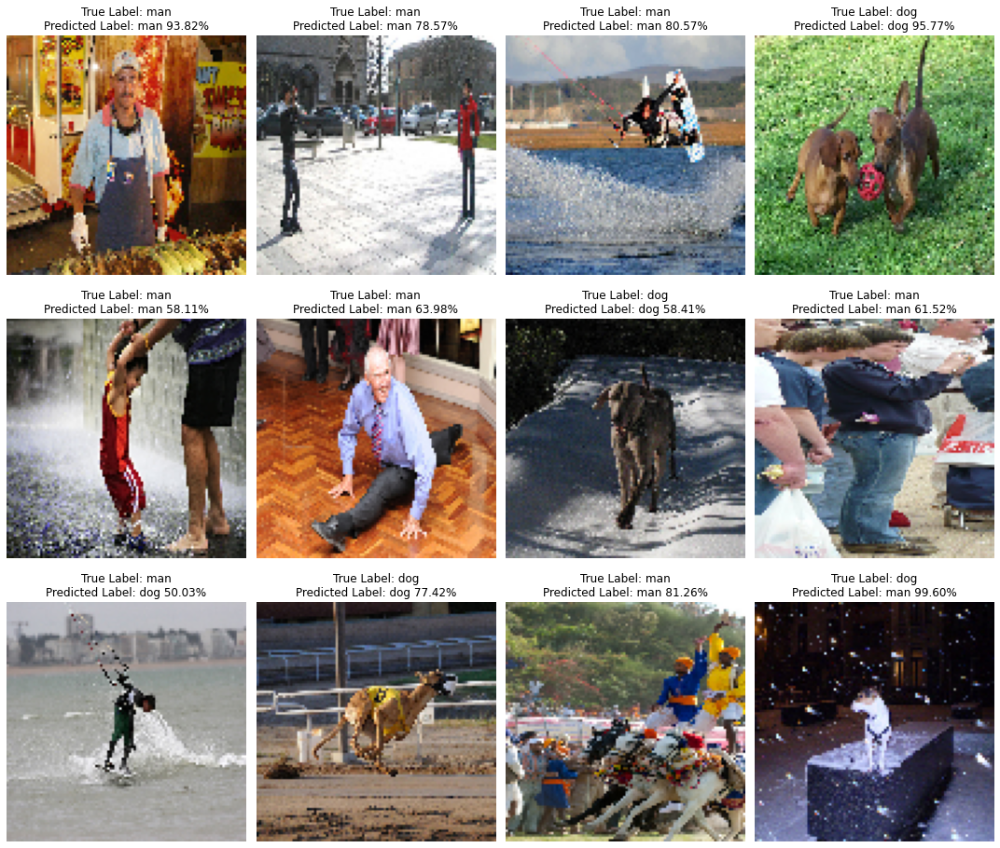

In [ ]:
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(15, 13))

for ax in axs.ravel():
    img, label = test_generator.next()
    ax.imshow(img[0])
    pred = cnn.predict(img)
    true_label = IMAGE_LABELS[np.argmax(label[0])]
    pred_label = IMAGE_LABELS[np.argmax(pred)]
    ax.set_title(f'True Label: {true_label}\nPredicted Label: {pred_label} {100*np.max(pred):.2f}%')
    ax.axis('off')

plt.tight_layout()
plt.show()

### Baseline Model3 - Binary classification - 'man' vs 'dog' - pretrain cnn model

#### Define model, hyperparameters and classification report

In [ ]:
MODE = 'multi_class' # 'multi_label'

IMAGE_LABELS = ['dog', 'man']
LABEL_CREATION = find_simple_class #find_labels #find_class

IMAGE_SIZE = 224
B_SIZE = 16
EPOCHS = 10
HEAD_UNITS = 256
TRAIN_ALL = True
LR = 3e-5
PATIENCE = 3
MODELS = xception.Xception

df_train, df_test = create_df(LABEL_CREATION)

train_g, valid_g, test_g = create_image_generators(\
                    df_train,df_test,seed=1,target_size=(IMAGE_SIZE, IMAGE_SIZE),\
                    batch_size=B_SIZE)

models = train_evaluate_model(train_g, valid_g, test_g ,IMAGE_SIZE,MODELS,train_all = TRAIN_ALL,\
                  mode=MODE,lr=LR, patience = PATIENCE,epoch=EPOCHS,head_units = HEAD_UNITS)


man    2341
dog    1963
Name: label, dtype: int64 

Found 3486 validated image filenames belonging to 2 classes.
Found 387 validated image filenames belonging to 2 classes.
Found 431 validated image filenames belonging to 2 classes.
83697664/83683744 [==============================] - 0s 0us/step


Epoch 1/10
218/218 [==============================] - 54s 226ms/step - loss: 0.2234 - accuracy: 0.9200 - val_loss: 0.1974 - val_accuracy: 0.9432
Epoch 2/10
218/218 [==============================] - 47s 217ms/step - loss: 0.0623 - accuracy: 0.9768 - val_loss: 0.2860 - val_accuracy: 0.9276
Epoch 3/10
218/218 [==============================] - 47s 217ms/step - loss: 0.0197 - accuracy: 0.9931 - val_loss: 0.3285 - val_accuracy: 0.9251
Epoch 4/10
218/218 [==============================] - 47s 217ms/step - loss: 0.0203 - accuracy: 0.9937 - val_loss: 0.3523 - val_accuracy: 0.9328


431/431 [==============================] - 4s 9ms/step - loss: 0.1811 - accuracy: 0.9582
              precision    re

#### Examples

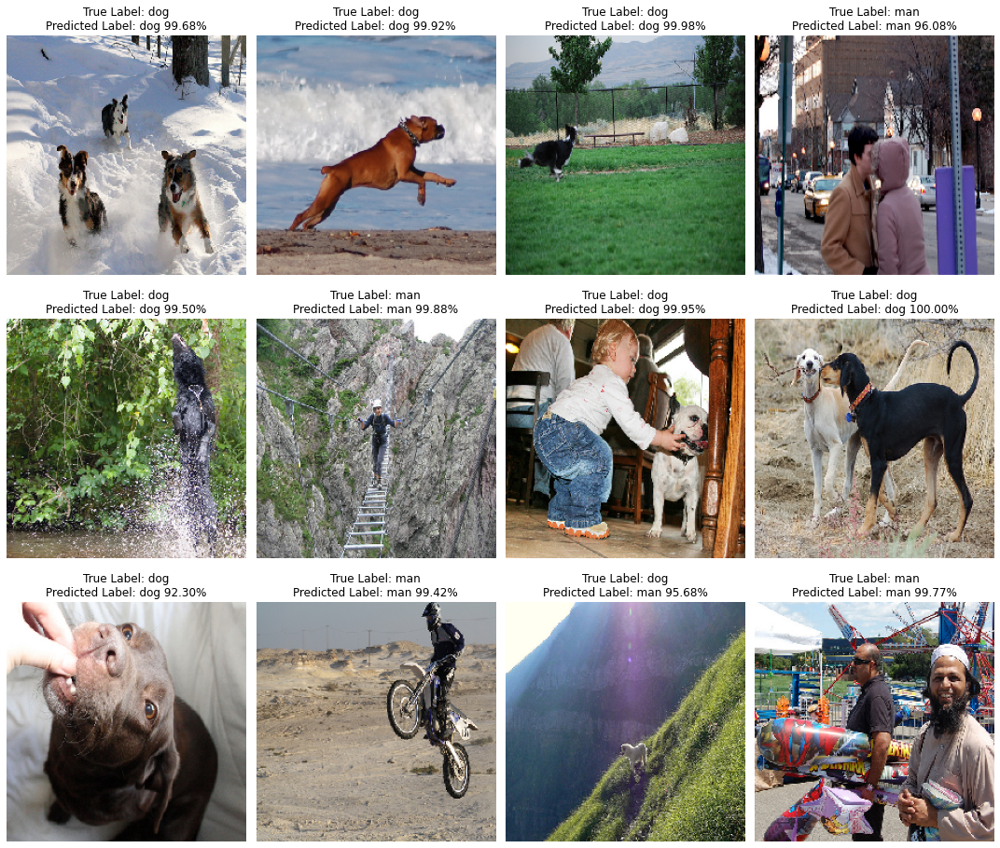

In [ ]:
fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(15, 13))

for ax in axs.ravel():
    img, label = test_g.next()
    ax.imshow(img[0])
    pred = models.predict(img)
    true_label = IMAGE_LABELS[np.argmax(label[0])]
    pred_label = IMAGE_LABELS[np.argmax(pred)]
    ax.set_title(f'True Label: {true_label}\nPredicted Label: {pred_label} {100*np.max(pred):.2f}%')
    ax.axis('off')

plt.tight_layout()
plt.show()

### Results of Baseline Models

In [7]:
from IPython.display import Image
Image(url= "https://user-images.githubusercontent.com/100131903/177389329-657e431c-1ae8-41df-a31f-6a311d36dd8e.png", width=600, height=400)

## Final Models - Generate Captions for Images

### Model4 - Multi-label classification - pretrain cnn model

#### Define model, hyperparameters and classification report

In [ ]:
MODE = 'multi_label' # 'multi_label'

IMAGE_LABELS = {'person': ['man', 'men' ,'woman' ,'women','guy', 'lady' ,'person' ,'people','boy', 'girl','child','kid','children','NOUN1'],
                'dog': ['dog','dogs','NOUN1'],
                'water': ['water','NOUN2'],
                'grass': ['grass','NOUN2'],
                'street':['street','NOUN2'],
                'jump': ['jump','jumping','VERB'],
                'run': ['run','runs','runing','VERB'],
                'ride': ['riding','ride','VERB'],
                'sit': ['sit','VERB']}

if MODE == 'multi_class':
  LABEL_CREATION = find_class
elif MODE == 'multi_label':
  LABEL_CREATION = find_labels

IMAGE_SIZE = 256
B_SIZE = 16
EPOCHS = 30
HEAD_UNITS = 128
LR_ALL = 3e-5
LR = 3e-5
PATIENCE = 1
pre_trained_model = xception.Xception

df_train, df_test = create_df(LABEL_CREATION)

AUG = True
TRAIN_ALL=True

train_g, valid_g, test_g = create_image_generators(\
          df_train,df_test,seed=1,target_size=(IMAGE_SIZE, IMAGE_SIZE),\
          batch_size=B_SIZE,augmentation=AUG)

model = train_evaluate_model(train_g, valid_g, test_g ,IMAGE_SIZE,pre_trained_model,train_all = TRAIN_ALL,\
                    mode=MODE,lr=LR, patience = PATIENCE,epoch=EPOCHS,head_units = HEAD_UNITS)

[person]                    2461
[sit, person]                553
[jump, person]               423
[ride, person]               382
[person, water]              377
                            ... 
[ride, run]                    1
[sit, dog, water]              1
[grass, ride, jump]            1
[street, dog, jump]            1
[grass, sit, dog, water]       1
Name: label, Length: 138, dtype: int64 

Found 6553 validated image filenames belonging to 9 classes.
Found 728 validated image filenames belonging to 9 classes.
Found 810 validated image filenames belonging to 9 classes.


Epoch 1/30
410/410 [==============================] - 136s 316ms/step - loss: 0.2795 - precision: 0.8139 - recall: 0.6077 - accuracy: 0.7455 - val_loss: 0.2314 - val_precision: 0.8044 - val_recall: 0.7029 - val_accuracy: 0.7390
Epoch 2/30
410/410 [==============================] - 133s 323ms/step - loss: 0.2167 - precision: 0.8452 - recall: 0.7023 - accuracy: 0.7645 - val_loss: 0.2154 - val_precision: 0.8305 -

/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_classification.py:1318: UndefinedMetricWarning: Recall and F-score are ill-defined and being set to 0.0 in samples with no true labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
pip install pyinflect

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     |████████████████████████████████| 703 kB 8.6 MB/s 


#### A function for creating captions from the labels

In [ ]:
import nltk
from nltk.tokenize import word_tokenize
nltk.download('averaged_perceptron_tagger')
nltk.download('punkt')
nltk.download('universal_tagset')
from collections import Counter
from pyinflect import getInflection

def create_caption(pred_labels_in):

  labels_pos_tag = {pred_label:IMAGE_LABELS[pred_label][-1] for pred_label in pred_labels_in}
  mydict=dict(labels_pos_tag)
  pos_tag_labels = defaultdict(list)
  for key, value in mydict.items():
    pos_tag_labels[value].append(key)

# create caption
  caption = ['A']
  if 'NOUN1' in pos_tag_labels:
      for n, noun in enumerate(pos_tag_labels['NOUN1']):
          if n > 0:
              caption += ['and a']
          caption += [noun]
  if 'VERB' in pos_tag_labels:
      for n, verb in enumerate(pos_tag_labels['VERB']):
          if n > 0:
              caption += ['and']
          verb = getInflection(verb, tag='VBG')[0]
          caption += [verb]
  if 'NOUN2' in pos_tag_labels:
      for n, noun in enumerate(pos_tag_labels['NOUN2']):
          if n > 0:
              caption += ['and']
          caption += ['on the', noun]

  return ' '.join(caption)



[nltk_data] Downloading package averaged_perceptron_tagger to
[nltk_data]     /root/nltk_data...
[nltk_data]   Package averaged_perceptron_tagger is already up-to-
[nltk_data]       date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!
[nltk_data] Downloading package universal_tagset to /root/nltk_data...
[nltk_data]   Package universal_tagset is already up-to-date!


#### Examples

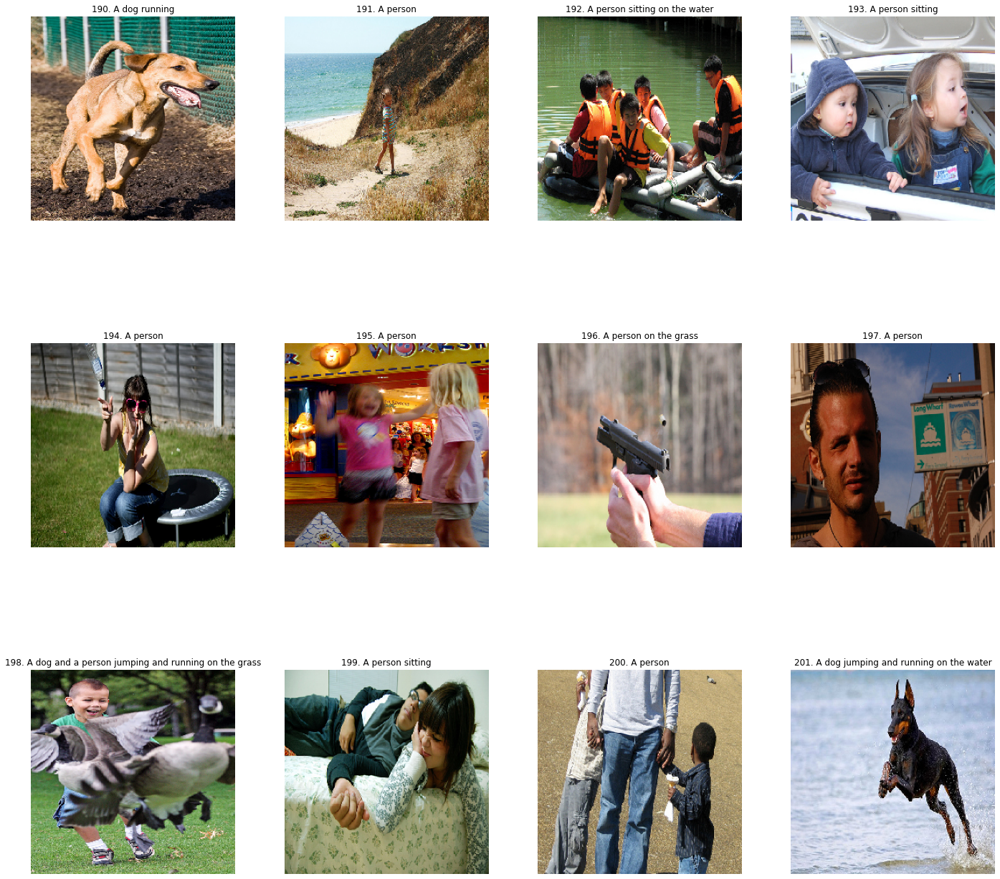

In [ ]:
from collections import defaultdict

fig, axs = plt.subplots(nrows=3, ncols=4, figsize=(20, 20))

image_i = 190

for ax in axs.ravel():

  img, label = test_g[image_i]
  ax.imshow(img[0])
  pred = model.predict(img)
  labels = np.array(list(test_g.class_indices.keys()))
  true_label = labels[label.astype(bool)[0]]

  thresh = 0.3
  y_pred = np.array([[1 if i > thresh else 0 for i in j] for j in pred])
  pred_labels = labels[y_pred.astype(bool)[0]]

  pred_caption = create_caption(pred_labels)
  ax.set_title(f'{image_i}. {pred_caption}')
  ax.axis('off');
  image_i +=1

plt.tight_layout();
plt.show();


### Model 5 - Vision Encoder Decoder

#### imports 

In [ ]:
! pip install transformers
! pip install datasets

In [ ]:
import matplotlib.pyplot as plt
import pandas as pd
import pickle
import numpy as np
import os
import matplotlib.pyplot as plt

#### Loading the tokenizer and the feature extractor

In [ ]:
from PIL import Image
from transformers import AutoFeatureExtractor, AutoTokenizer, TFVisionEncoderDecoderModel

decoder_tokenizer = AutoTokenizer.from_pretrained("gpt2")
feature_extractor = AutoFeatureExtractor.from_pretrained("google/vit-base-patch16-224-in21k")

Downloading:   0%|          | 0.00/665 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/0.99M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/446k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/1.29M [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/160 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/502 [00:00<?, ?B/s]

#### Splitting into train and test

In [ ]:
from sklearn.model_selection import train_test_split

train_df=df[:36000]
test_df = df[36000:]

# we reset the indices to start from zero
train_df.reset_index(drop=True, inplace=True)
test_df.reset_index(drop=True, inplace=True)

#### Creating a Dataset object

In [ ]:
# This is the max_length of the sentence
MAX_LENGTH = 15

In [ ]:
import torch
from torch.utils.data import Dataset
from PIL import Image

class MyDataset(Dataset):
    def __init__(self, root_dir, df, max_target_length=MAX_LENGTH):
        self.root_dir = root_dir
        self.df = df
        self.max_target_length = max_target_length

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        # get file name + text 
        file_name = self.df['image'][idx]
        caption = self.df['caption'][idx]
        # prepare image (i.e. resize + normalize)
        image = Image.open(self.root_dir + file_name).convert("RGB").resize((224,224))
        pixel_values = feature_extractor(images=image, return_tensors="pt").pixel_values

        # add labels (input_ids) by encoding the text
        labels = decoder_tokenizer(caption, padding="max_length", 
                                   max_length=self.max_target_length,
                                   truncation=True).input_ids

        # important: make sure that PAD tokens are ignored by the loss function
        labels = [label if label != decoder_tokenizer.pad_token_id else -100 for label in labels]

        encoding = {"pixel_values": pixel_values.squeeze(), "labels": torch.tensor(labels)}
        return encoding

In [ ]:
train_dataset = MyDataset(root_dir='Images/', df=train_df)
eval_dataset = MyDataset(root_dir='Images/', df=test_df)

In [ ]:
# defining the padding token
decoder_tokenizer.pad_token = decoder_tokenizer.eos_token

#### Example of image from the train dataset

In [ ]:
encoding = train_dataset[3]
for k,v in encoding.items():
  print(k, v.shape)

pixel_values torch.Size([3, 224, 224])
labels torch.Size([15])


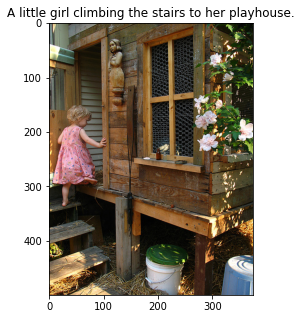

In [ ]:
image = Image.open(train_dataset.root_dir + train_df['image'][0]).convert("RGB")
labels = encoding['labels']

labels[labels == -100] = decoder_tokenizer.pad_token_id
label_str = decoder_tokenizer.decode(labels, skip_special_tokens=True)

plt.figure(figsize=(12,5))
plt.title(label_str)
plt.imshow(image);

#### Loading the Vision Encoder-Decoder model

In [ ]:
from transformers import VisionEncoderDecoderModel

# initialize a bert2gpt2 from a pretrained BERT and GPT2 models. Note that the cross-attention layers will be randomly initialized
model = VisionEncoderDecoderModel.from_encoder_decoder_pretrained(
    "google/vit-base-patch16-224-in21k", "gpt2"
)

#### Configuration and Hyperparameters

In [ ]:
# setting special tokens used for creating the decoder_input_ids from the labels
model.config.decoder_start_token_id = decoder_tokenizer.bos_token_id
model.config.pad_token_id = decoder_tokenizer.pad_token_id
model.config.decoder.pad_token_id = decoder_tokenizer.pad_token_id

# making sure vocab size is set correctly
model.config.vocab_size = model.config.decoder.vocab_size

# setting beam search parameter
model.config.eos_token_id = decoder_tokenizer.sep_token_id
model.config.max_length = MAX_LENGTH
model.config.early_stopping = True
model.config.no_repeat_ngram_size = 3
model.config.length_penalty = 2.0
model.config.num_beams = 4
model.decoder.resize_token_embeddings(len(decoder_tokenizer))

# freezing the encoder
for param in model.encoder.parameters():
    param.requires_grad = False

In [ ]:
from transformers import Seq2SeqTrainer, Seq2SeqTrainingArguments

training_args = Seq2SeqTrainingArguments(
    "Image-Captioning",
    predict_with_generate=True, 
    evaluation_strategy="steps", 
    save_strategy="steps",
    per_device_train_batch_size=5, 
    per_device_eval_batch_size=5, 
    overwrite_output_dir=False, 
    #output_dir=output_dir, 
    fp16=True, 
    learning_rate=4e-5,
    num_train_epochs = 3,
    load_best_model_at_end=True,
    logging_steps=3500,
    eval_steps=3500,
    save_steps=7000,
    report_to="none",
    disable_tqdm=False,
)

PyTorch: setting up devices


In [ ]:
from transformers import default_data_collator

trainer = Seq2SeqTrainer(
    model=model,
    tokenizer=feature_extractor,
    args=training_args,
    train_dataset=train_dataset,
    eval_dataset=eval_dataset,
    data_collator=default_data_collator,
)

Using cuda_amp half precision backend


#### Train Model

In [ ]:
trainer.train()

/usr/local/lib/python3.7/dist-packages/transformers/optimization.py:310: FutureWarning: This implementation of AdamW is deprecated and will be removed in a future version. Use the PyTorch implementation torch.optim.AdamW instead, or set `no_deprecation_warning=True` to disable this warning
  FutureWarning,
***** Running training *****
  Num examples = 36000
  Num Epochs = 3
  Instantaneous batch size per device = 5
  Total train batch size (w. parallel, distributed & accumulation) = 5
  Gradient Accumulation steps = 1
  Total optimization steps = 21600


Step,Training Loss,Validation Loss
3500,2.856100,2.608658
7000,2.571000,2.496941
10500,2.285700,2.466862
14000,2.243800,2.441315
17500,2.082300,2.448084
21000,2.050900,2.432509


***** Running Evaluation *****
  Num examples = 4455
  Batch size = 5
***** Running Evaluation *****
  Num examples = 4455
  Batch size = 5
Saving model checkpoint to Image-Captioning/checkpoint-7000
Configuration saved in Image-Captioning/checkpoint-7000/config.json
Model weights saved in Image-Captioning/checkpoint-7000/pytorch_model.bin
Feature extractor saved in Image-Captioning/checkpoint-7000/preprocessor_config.json
***** Running Evaluation *****
  Num examples = 4455
  Batch size = 5
***** Running Evaluation *****
  Num examples = 4455
  Batch size = 5
Saving model checkpoint to Image-Captioning/checkpoint-14000
Configuration saved in Image-Captioning/checkpoint-14000/config.json
Model weights saved in Image-Captioning/checkpoint-14000/pytorch_model.bin
Feature extractor saved in Image-Captioning/checkpoint-14000/preprocessor_config.json
***** Running Evaluation *****
  Num examples = 4455
  Batch size = 5
***** Running Evaluation *****
  Num examples = 4455
  Batch size = 5
Sa

TrainOutput(global_step=21600, training_loss=2.339501303213614, metrics={'train_runtime': 4143.7921, 'train_samples_per_second': 26.063, 'train_steps_per_second': 5.213, 'total_flos': 1.9490100240973824e+19, 'train_loss': 2.339501303213614, 'epoch': 3.0})

#### Examples

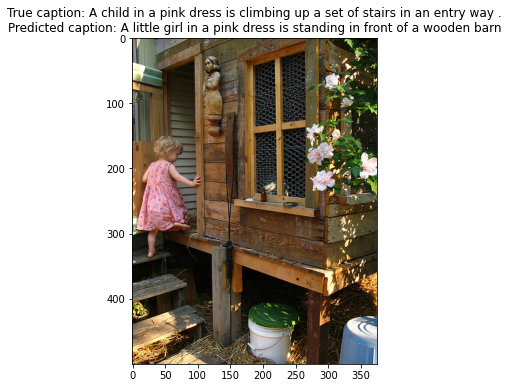

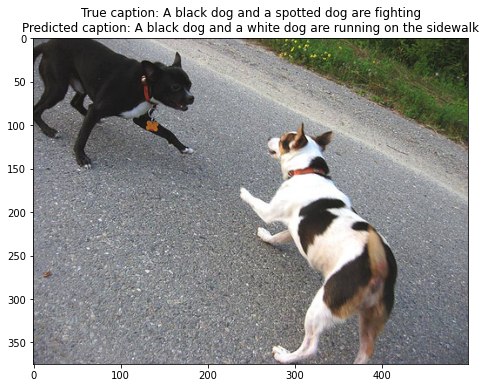

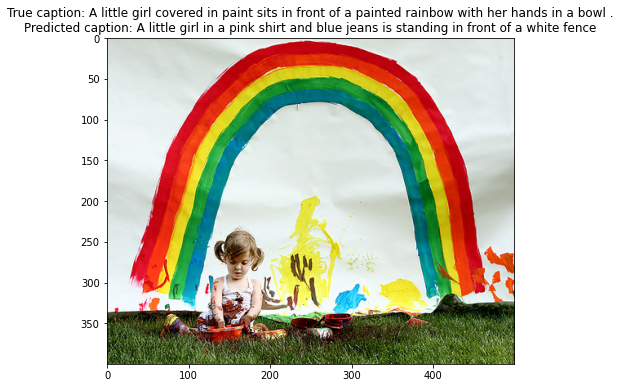

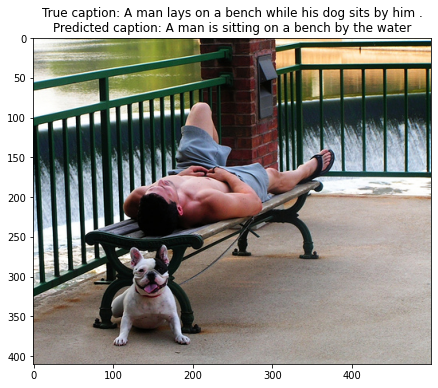

In [ ]:
import PIL

for i, row in df[36000:36020:5].iterrows():
  image = PIL.Image.open('Images/' + row['image'])
  sample = feature_extractor(image, return_tensors="pt").pixel_values.to('cuda')
  caption_ids = model.generate(sample, max_length = 20)[0]
  caption_text = decoder_tokenizer.decode(caption_ids, skip_special_tokens=True)
  caption_text = caption_text.split('.')[0]

  plt.figure(figsize=(12,6))
  plt.title(f"True caption: {row['caption']}\nPredicted caption: {caption_text}")
  plt.imshow(image)
  plt.show();

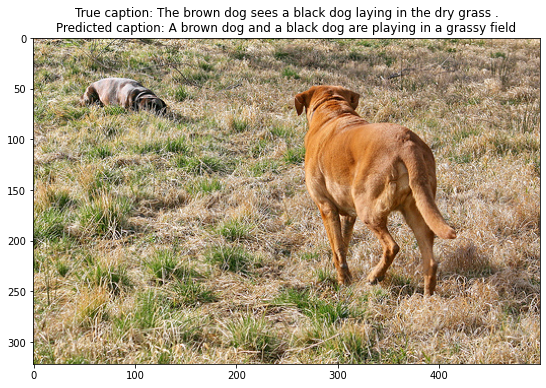

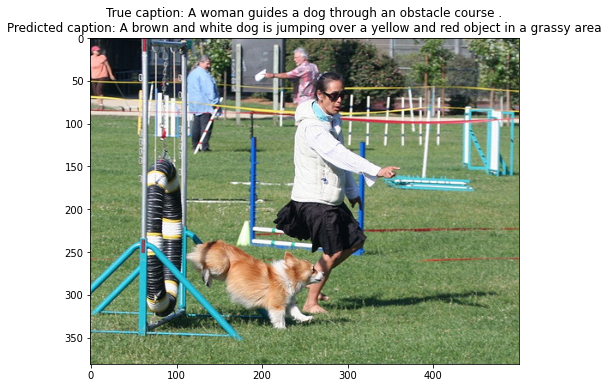

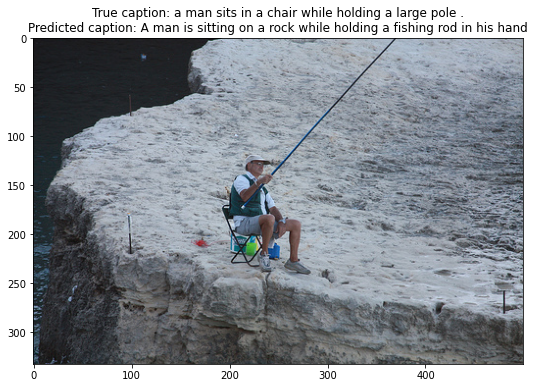

In [25]:
import PIL

for i, row in df.sample(3).iterrows():
  image = PIL.Image.open('Images/' + row['image'])
  sample = feature_extractor(image, return_tensors="pt").pixel_values.to('cuda')
  caption_ids = model.generate(sample)[0]
  caption_text = decoder_tokenizer.decode(caption_ids, skip_special_tokens=True)
  caption_text = caption_text.split('.')[0]

  plt.figure(figsize=(12,6))
  plt.title(f"True caption: {row['caption']}\nPredicted caption: {caption_text}")
  plt.imshow(image)
  plt.show();

### Metrics

In [ ]:
!pip install evaluate
!pip install rouge_score
!pip install git+https://github.com/google-research/bleurt.git
!pip install sacrebleu
!pip install jiwer jiwer

In [27]:
import evaluate

In [ ]:
bleu = evaluate.load("bleu")
bleurt = evaluate.load("bleurt", module_type="metric")

#### Metrics - pretrain cnn model

In [34]:
from tqdm import tqdm 

for i, row in tqdm(test_df.iterrows()):
  image = PIL.Image.open('Images/' + row['image'])
  sample = feature_extractor(image, return_tensors="pt").pixel_values.to('cuda')
  caption_ids = model.generate(sample)[0]
  caption_text = decoder_tokenizer.decode(caption_ids, skip_special_tokens=True)

  test_df.at[i, 'predictions'] = caption_text

4455it [31:57,  2.32it/s]


In [35]:
predictions_bleu = []
references_bleu = []
predictions = []
references = []
temp=[]

for i, row in test_df.iterrows():
  temp.append(row['caption'].lower().split('.')[0])
  if (i+1)%5==0:
    predictions_bleu.append(row['predictions'].lower().split('.')[0])
    references_bleu.append(temp)
    temp=[]
  
  predictions.append(row['predictions'].lower().split('.')[0])
  references.append(row['caption'].lower().split('.')[0])

In [156]:
results_bleu = bleu.compute(predictions=predictions_cnn, references=references, max_order=2)
print(results_bleu)

{'bleu': 0.0005674290362808175, 'precisions': [0.0729126213592233, 0.008212147134302824], 'brevity_penalty': 0.023188990278638185, 'length_ratio': 0.2099042184634196, 'translation_length': 10300, 'reference_length': 49070}


In [137]:
results_bleu = bleu.compute(predictions=predictions_cnn, references=references, max_order=3)
print(results_bleu)

{'bleu': 0.00025995928864030766, 'precisions': [0.0729126213592233, 0.008212147134302824, 0.002352941176470588], 'brevity_penalty': 0.023188990278638185, 'length_ratio': 0.2099042184634196, 'translation_length': 10300, 'reference_length': 49070}


In [102]:
results_bleurt = bleurt.compute(predictions=predictions_cnn, references=references)
print(results_bleurt)

{'scores': [-2.0834200382232666, -1.8100616931915283, -1.748877763748169, -1.6469097137451172, -1.5839529037475586, -1.9179730415344238, -1.8232674598693848, -1.5468013286590576, -1.4502949714660645, -1.622044324874878, -1.502335548400879, -1.9772093296051025, -2.1736745834350586, -1.7589781284332275, -2.1632041931152344, -2.1902315616607666, -1.8555163145065308, -2.101578712463379, -2.0134544372558594, -1.8608365058898926, -1.462520956993103, -1.6428041458129883, -1.656218409538269, -1.709730863571167, -1.7351393699645996, -1.228737235069275, -1.1923457384109497, -1.0593287944793701, -1.3569326400756836, -1.2392922639846802, -1.5563703775405884, -1.948118805885315, -1.4181240797042847, -1.5843091011047363, -1.8284947872161865, -1.3220089673995972, -1.1621623039245605, -1.411597728729248, -1.4584838151931763, -1.3222885131835938, -1.768385410308838, -1.6544241905212402, -1.6411775350570679, -1.717089295387268, -1.508684754371643, -0.8755888938903809, -1.069746971130371, -1.082040071487

#### Metrics - Vision Encoder Decoder

In [34]:
from tqdm import tqdm 

for i, row in tqdm(test_df.iterrows()):
  image = PIL.Image.open('Images/' + row['image'])
  sample = feature_extractor(image, return_tensors="pt").pixel_values.to('cuda')
  caption_ids = model.generate(sample)[0]
  caption_text = decoder_tokenizer.decode(caption_ids, skip_special_tokens=True)

  test_df.at[i, 'predictions'] = caption_text

4455it [31:57,  2.32it/s]


In [35]:
predictions_bleu = []
references_bleu = []
predictions = []
references = []
temp=[]

for i, row in test_df.iterrows():
  temp.append(row['caption'].lower().split('.')[0])
  if (i+1)%5==0:
    predictions_bleu.append(row['predictions'].lower().split('.')[0])
    references_bleu.append(temp)
    temp=[]
  
  predictions.append(row['predictions'].lower().split('.')[0])
  references.append(row['caption'].lower().split('.')[0])

In [158]:
results_bleu = bleu.compute(predictions=predictions_bleu, references=references_bleu, max_order=1)
print(results_bleu)

{'bleu': 0.6004616805170822, 'precisions': [0.6004616805170822], 'brevity_penalty': 1.0, 'length_ratio': 1.6529304029304028, 'translation_length': 10830, 'reference_length': 6552}


In [43]:
results_bleu = bleu.compute(predictions=predictions_bleu, references=references_bleu, max_order=2)
print(results_bleu)

{'bleu': 0.4286974579198021, 'precisions': [0.6004616805170822, 0.3060670087533957], 'brevity_penalty': 1.0, 'length_ratio': 1.6529304029304028, 'translation_length': 10830, 'reference_length': 6552}


In [157]:
results_bleu = bleu.compute(predictions=predictions_bleu, references=references_bleu, max_order=3)
print(results_bleu)

{'bleu': 0.30005459958022074, 'precisions': [0.6004616805170822, 0.3060670087533957, 0.14699381078691423], 'brevity_penalty': 1.0, 'length_ratio': 1.6529304029304028, 'translation_length': 10830, 'reference_length': 6552}


In [38]:
results_bleurt = bleurt.compute(predictions=predictions, references=references)
print(results_bleurt)

{'scores': [-0.4033249318599701, -0.7261215448379517, -0.1131700724363327, -0.35148942470550537, -0.4435330629348755, -0.6018460392951965, -0.7262787222862244, -1.1211060285568237, -1.0059279203414917, -0.6306316256523132, -1.3457870483398438, -0.6961913704872131, -1.0578322410583496, -0.8548145890235901, -0.9780114889144897, -0.9634326696395874, -1.0142728090286255, -1.0913686752319336, -0.8914713263511658, -1.0935906171798706, -0.5012399554252625, -0.08661225438117981, -0.8466053605079651, -0.3130754232406616, 0.17679624259471893, -0.5699500441551208, -0.7063477039337158, -0.5322431921958923, -0.6658739447593689, -0.7992469668388367, -1.346238613128662, -0.8894577026367188, -1.4460793733596802, -1.2924681901931763, -0.7491517066955566, -0.27209630608558655, -0.1730484962463379, -0.9487344622612, -0.2939041554927826, -0.9344874024391174, -0.5340444445610046, -0.1412084996700287, 0.1531459093093872, -0.08021283149719238, -0.47801247239112854, -0.3999210596084595, -0.9976045489311218, -

### Summery of Results

In [9]:
from IPython.display import Image
Image(url= "https://user-images.githubusercontent.com/100131903/177394957-3055ba61-c126-42b7-b7e6-c75ab15347af.png", width=600, height=400)